## Topic Modelling on State of Union Data

### IMPORTING THE NECESSARY LIBRARIES

In [1]:
# Import required libraries
import csv
import pandas as pd
import numpy as np
from collections import defaultdict

import gensim
import re
from gensim import corpora
from gensim.models import TfidfModel
from gensim import models
from gensim.models import CoherenceModel
from gensim.parsing.preprocessing import remove_stopwords

from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.corpus import stopwords
from nltk import pos_tag
from nltk.corpus import wordnet
import nltk
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

import warnings

# Filter out DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [3]:
csv.field_size_limit(10000000000)

10000000000

In [4]:
# Download the WordNet and stopwords corpuses from NLTK
nltk.download('wordnet')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package wordnet to /Users/omishan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/omishan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### READING CSV USING PANDAS

In [5]:
# Load the csv with year and text columns
state_of_union = pd.read_csv('state-of-the-union.csv', names=['year', 'text'], header=None)

In [6]:
corpus = state_of_union['text']

### EXTENDING THE STOPWORDS LIST

In [7]:
# Reading the additional stopwords from the downloaded stopwords file 
custom_stopwords = []
with open('stopwords-en.csv', 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        custom_stopwords.extend(row)   

In [8]:
# Addining the additional stopwords to the existing list of stopwords
stopwords.extend(custom_stopwords)

### LEMMATZING, STEMMING AND PREPROCESSING THE DOCUMENT

In [9]:
# Defining a function to lemmatize a given word
def lemmatize_and_stem(text):
    # Initializing a WordNetLemmatizer object and lemmatizing the input text, considering it as a verb (pos='v')
    return (WordNetLemmatizer().lemmatize(text, pos='v'))

# Defining a function to preprocess a given text
def preprocess(text):
    # Initializing an empty list to store preprocessed tokens
    result=[]
    # Iterating through each token 
    for token in gensim.utils.simple_preprocess(text) : 
        # Checking if the token is not in the list of stopwords  
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_and_stem(token))
            
    return result

In [10]:
# Make text of each document lowercase, split it by white space, remove numbers, and filter out stopwords using the preprocess function
texts = [[re.sub(r"[0-9]+","",word) for word in  preprocess(document) if word not in stopwords]
         for document in corpus]

# Count word frequencies 
frequency = defaultdict(int)

# Loop through each token in each document in the preprocessed texts
for text in texts:
    for token in text:
        frequency[token] += 1

# Only keep words that appear more than once
preprocessed_document = [[token for token in text if (frequency[token] > 1 )] for text in texts]

# Remove empty strings from the preprocessed document
while('' in preprocessed_document) : 
    preprocessed_document.remove('') 
print(preprocessed_document[0])

['george', 'washington', 'january', 'fellow', 'citizens', 'senate', 'house', 'representatives', 'embrace', 'great', 'satisfaction', 'opportunity', 'present', 'congratulate', 'present', 'favorable', 'prospect', 'public', 'affairs', 'recent', 'accession', 'important', 'state', 'north', 'carolina', 'constitution', 'unite', 'state', 'official', 'information', 'receive', 'rise', 'credit', 'respectability', 'country', 'general', 'increase', 'good', 'government', 'union', 'concord', 'peace', 'plenty', 'bless', 'circumstances', 'auspicious', 'eminent', 'degree', 'national', 'prosperity', 'resume', 'consultations', 'general', 'good', 'derive', 'encouragement', 'reflection', 'measure', 'session', 'satisfactory', 'constituents', 'novelty', 'difficulty', 'work', 'allow', 'hope', 'realize', 'expectations', 'secure', 'bless', 'gracious', 'providence', 'place', 'reach', 'course', 'present', 'important', 'session', 'cool', 'deliberate', 'exertion', 'patriotism', 'firmness', 'wisdom', 'interest', 'obje

### CONVERTING THE PREPROCESSED CORPUS INTO A DICTIONARY 

In [11]:
# Creating a dictionary object from the preprocessed document
dictionary = corpora.Dictionary(preprocessed_document)

# Filter out words that occur less than 5 documents, or more than 50% of the documents
dictionary.filter_extremes(no_below=5, no_above=0.5)

print(dictionary)

Dictionary<5789 unique tokens: ['accession', 'accord', 'admit', 'advancement', 'aggressors']...>


### APPLYING BOW CORPUS TO GENERATE A BAG-OG-WORDS FROM THE DICTIONARY

In [12]:
# Each document in the preprocessed document is converted into a bag-of-words representation
bow_corpus = [dictionary.doc2bow(text) for text in preprocessed_document]

# Creating a TF-IDF model from the bag-of-words corpus
tfidf_model = models.TfidfModel(bow_corpus)

# Transforming the bag-of-words corpus into a TF-IDF weighted corpus
tfidf_corpus = tfidf_model[bow_corpus]

# Print TF-IDF scores of the first document
print(list(tfidf_corpus)[0])

[(0, 0.09056349662037212), (1, 0.02584619789680415), (2, 0.030705861896829386), (3, 0.05974847830112979), (4, 0.10580084702698574), (5, 0.027167214964332564), (6, 0.033414611632165914), (7, 0.045841803837282716), (8, 0.02650047484820711), (9, 0.030335458464128842), (10, 0.10275520539597786), (11, 0.09056349662037212), (12, 0.05142930553877209), (13, 0.03860972705387093), (14, 0.037688547633425544), (15, 0.09995348668765111), (16, 0.02584619789680415), (17, 0.07753859369041244), (18, 0.08856279222083054), (19, 0.09056349662037212), (20, 0.1270172959704174), (21, 0.04946601728149275), (22, 0.11282488279527005), (23, 0.10580084702698574), (24, 0.03506210619548125), (25, 0.024573228603125483), (26, 0.04946601728149275), (27, 0.05210899287078526), (28, 0.08153875645254621), (29, 0.11694761857112519), (30, 0.11694761857112519), (31, 0.060612788825632216), (32, 0.09494455679936391), (33, 0.05890499657685719), (34, 0.04003861107195148), (35, 0.0663014060459326), (36, 0.11282488279527005), (37,

### COMPUTING COHERENCE OF LSI MODEL TO FIND OPTIMIZES NUMBER OF TOPICS

In [13]:
# Declaring a fuction to compute coherence values using LSI model, to find optimized number of topics

def coherence_LSI(dictionary, corpus, texts, limit, start = 15, step = 1):

    # Initialize empty lists to store the models and coherence values
    coherence_values = []
    model_list = []

    # Iterate over different numbers of topics, starting from 'start' and ending at 'limit', with a step size of 'step'
    for num_topics in range(start, limit, step):

        # Train the LSI model with the current number of topics
        model = gensim.models.LsiModel(corpus = corpus, num_topics = num_topics, id2word = dictionary)

        # Append the trained model to the list of models
        model_list.append(model)

        # Compute coherence value for the trained model using the 'c_v' coherence measure
        coherencemodel = CoherenceModel(model = model, texts = texts, dictionary = dictionary, coherence = 'c_v')
        coherence_values.append(coherencemodel.get_coherence())

    # Return the list of models with coherence values using the 'c_v' coherence measure
    return model_list, coherence_values

In [14]:
# Adjust to compute coherence values in 1 step intervals
model_list_LSI, coherence_values_LSI = coherence_LSI(dictionary = dictionary, corpus = bow_corpus, texts = preprocessed_document, start = 15, limit = 35, step = 1)

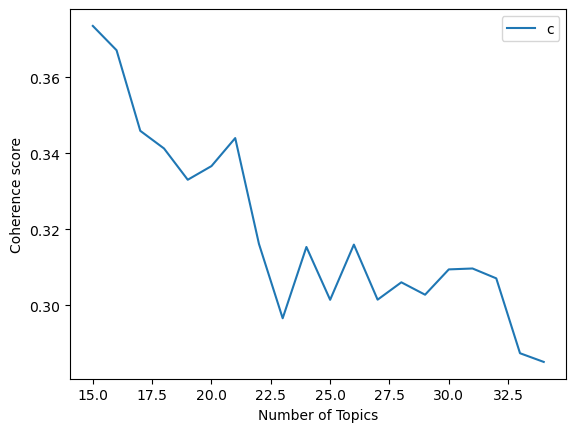

Number of Topics = 15  has Coherence Value of 0.3736
Number of Topics = 16  has Coherence Value of 0.3672
Number of Topics = 17  has Coherence Value of 0.346
Number of Topics = 18  has Coherence Value of 0.3413
Number of Topics = 19  has Coherence Value of 0.3331
Number of Topics = 20  has Coherence Value of 0.3367
Number of Topics = 21  has Coherence Value of 0.3441
Number of Topics = 22  has Coherence Value of 0.3162
Number of Topics = 23  has Coherence Value of 0.2966
Number of Topics = 24  has Coherence Value of 0.3154
Number of Topics = 25  has Coherence Value of 0.3015
Number of Topics = 26  has Coherence Value of 0.316
Number of Topics = 27  has Coherence Value of 0.3015
Number of Topics = 28  has Coherence Value of 0.3061
Number of Topics = 29  has Coherence Value of 0.3028
Number of Topics = 30  has Coherence Value of 0.3095
Number of Topics = 31  has Coherence Value of 0.3097
Number of Topics = 32  has Coherence Value of 0.3071
Number of Topics = 33  has Coherence Value of 0.

In [15]:
# Show graph with 1 step intervals
limit = 35
start = 15
step = 1  

# Plot the coherence scores
x = range(start, limit, step)
plt.plot(x, coherence_values_LSI)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

# Print the coherence scores with 1 step intervals
for m, cv in zip(x, coherence_values_LSI):
    print("Number of Topics =", m, " has Coherence Value of", round(cv, 4))

In [16]:
optimum_num_topics_LSI = start + (coherence_values_LSI.index(max(coherence_values_LSI)))
print(f"Optimum Number of Topics = {optimum_num_topics_LSI}, with Coherence Value of {max(coherence_values_LSI):.4f}")

Optimum Number of Topics = 15, with Coherence Value of 0.3736


### BUILDING LSI MODEL ON OPTIMIZED NUMBER OF TOPICS

In [17]:
# Train the LSI model with the optimum number of topics found above
lsi_model = models.LsiModel(tfidf_corpus, id2word=dictionary, num_topics=optimum_num_topics_LSI)

In [18]:
# Print the topics
for idx, topic in lsi_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.133*"program" + 0.103*"tonight" + 0.103*"help" + 0.091*"economic" + 0.091*"americans" + 0.088*"budget" + 0.076*"job" + 0.070*"today" + 0.068*"billion" + 0.067*"school"
Topic: 1 
Words: -0.174*"tonight" + -0.165*"program" + -0.146*"help" + -0.134*"americans" + -0.126*"job" + -0.123*"budget" + -0.098*"spend" + -0.095*"school" + -0.095*"economic" + -0.094*"billion"
Topic: 2 
Words: -0.213*"tonight" + 0.132*"economic" + 0.126*"program" + -0.122*"iraq" + 0.114*"interstate" + 0.113*"farm" + -0.112*"job" + -0.107*"americans" + -0.103*"terrorists" + 0.099*"industrial"
Topic: 3 
Words: -0.161*"silver" + 0.144*"program" + -0.112*"gold" + 0.112*"militia" + -0.105*"interstate" + -0.093*"corporations" + 0.091*"soviet" + -0.090*"circulation" + -0.088*"cent" + 0.088*"economic"
Topic: 4 
Words: -0.272*"interstate" + -0.210*"corporations" + -0.158*"railroad" + 0.132*"program" + 0.132*"mexico" + 0.121*"soviet" + 0.105*"silver" + -0.095*"corporation" + -0.093*"iraq" + -0.092*"combinati

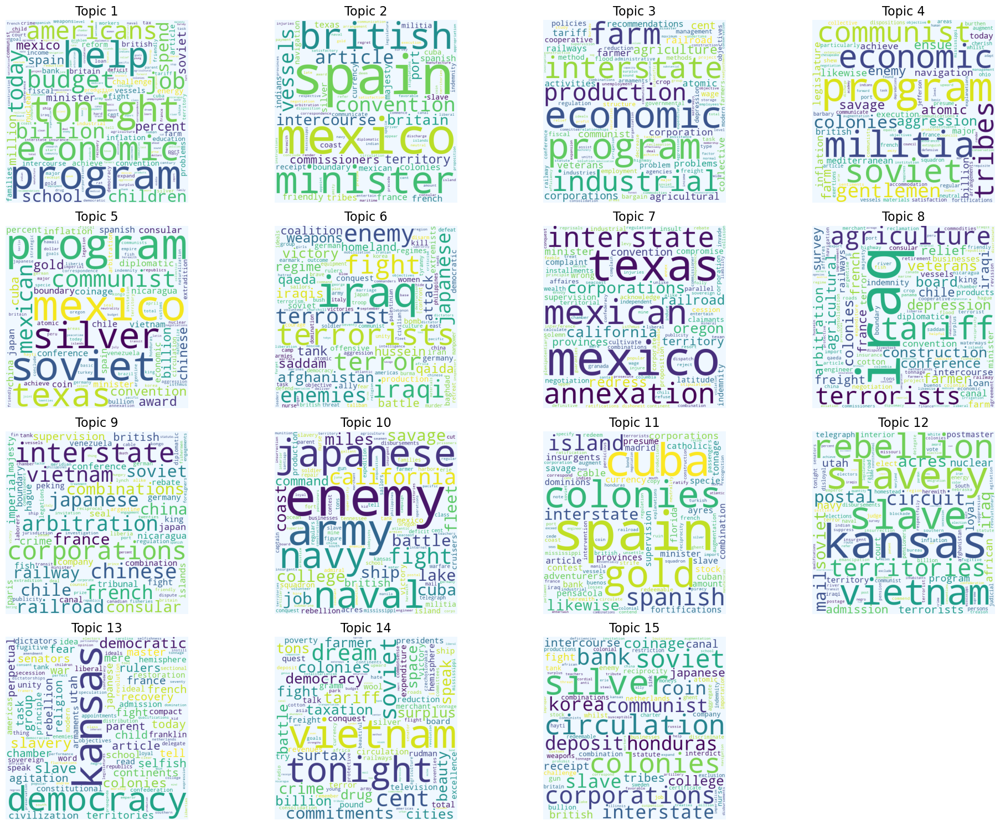

In [19]:
# Calculate the number of rows and columns for the subplots
num_cols = math.ceil(math.sqrt(optimum_num_topics_LSI))
num_rows = math.ceil(optimum_num_topics_LSI/ num_cols)

# Create a figure and axes for the subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 15), squeeze=False)

# Loop over the number of topics to generate word clouds
for i in range(optimum_num_topics_LSI):
    # Assuming lda_model.show_topic(i, topn=100) gets the top 100 words & their probabilities for topic i
    topic_words = dict(lsi_model.show_topic(i, topn=200))
    
    # Generate the word cloud
    cloud = WordCloud(width=500, height=500, background_color='aliceblue').generate_from_frequencies(topic_words)
    
    # Calculate the row and column index for the current subplot
    row = i // num_cols
    col = i % num_cols
    
    # Plot the word cloud on the corresponding subplot
    axes[row, col].imshow(cloud)
    axes[row, col].set_title(f'Topic {i+1}', fontdict={'size': 16})
    axes[row, col].axis('off')

# Remove any unused subplots
for i in range(optimum_num_topics_LSI, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

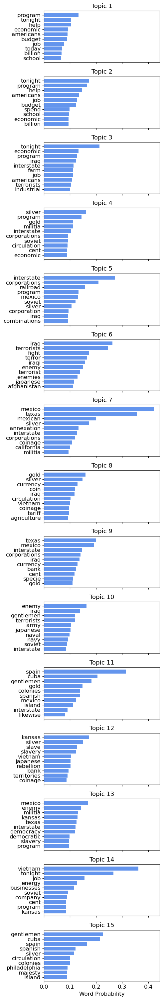

In [57]:
# Create an illustrative visualization of the LSI model 

#Extract number of topics from LSI model
topics = lsi_model.show_topics(num_topics=-1, num_words=10, formatted=False)
num_topics = len(topics)

# Create a figure with subplots based on the number of topics
fig, axs = plt.subplots(num_topics, 1, figsize=(5, num_topics * 2.0), sharex=True)
fig.subplots_adjust(hspace=0.5)  

# Iterate over each topic and plot its word importance
for i, (topic_id, topic) in enumerate(topics):
    # Extract words and their probabilities from each topic
    words = [word for word, _ in topic]
    probs = [abs(prob) for _, prob in topic]
    # Plot horizontal bar chart for each topic
    axs[i].barh(range(len(words)), probs, align='center', color='cornflowerblue')
    axs[i].set_yticks(range(len(words)))
    axs[i].set_yticklabels(words, fontsize=12)
    # Invert y-axis to have the most important words at the top
    axs[i].invert_yaxis()
    axs[i].set_title(f'Topic {topic_id+1}', fontsize=13)
    axs[i].tick_params(axis='both', which='major', labelsize=12)

plt.xlabel('Word Probability', fontsize=12) 
plt.tight_layout()
plt.show()


### DEFINING TOPIC NAMES FOR EACH TOPIC GENERATED BY THE LSI ALGORITHM

### SELECTING 10 TPICS AT RANDOM TO PERFORM CLOSER ANALYSIS

In [22]:
# Sampling 10 random topics from the 15 topics generated above

# Randomly sample ten topics for closer analysis
selected_topics_LSI = np.random.choice(range(num_topics), size=10, replace=False)

print("\nSampled Topics for Closer Analysis:\n")
sampled_topics = [(topic_num, lsi_model.print_topic(topic_num)) for topic_num in selected_topics_LSI]
for topic_num, topic in sampled_topics:
    print(f"Topic {topic_num}: {topic}")


Sampled Topics for Closer Analysis:

Topic 12: -0.168*"mexico" + -0.141*"enemy" + -0.131*"militia" + 0.129*"kansas" + -0.125*"texas" + -0.120*"interstate" + 0.120*"democracy" + 0.098*"democratic" + 0.097*"slavery" + -0.096*"program"
Topic 13: 0.362*"vietnam" + 0.267*"tonight" + -0.155*"job" + -0.126*"energy" + -0.114*"businesses" + 0.091*"soviet" + -0.088*"company" + 0.085*"cent" + -0.084*"program" + -0.083*"kansas"
Topic 4: -0.272*"interstate" + -0.210*"corporations" + -0.158*"railroad" + 0.132*"program" + 0.132*"mexico" + 0.121*"soviet" + 0.105*"silver" + -0.095*"corporation" + -0.093*"iraq" + -0.092*"combinations"
Topic 8: -0.200*"texas" + -0.191*"mexico" + 0.145*"interstate" + 0.140*"corporations" + -0.136*"iraq" + -0.128*"currency" + -0.123*"bank" + -0.117*"cent" + -0.113*"specie" + -0.109*"gold"
Topic 5: 0.263*"iraq" + 0.245*"terrorists" + 0.173*"fight" + 0.165*"terror" + 0.157*"iraqi" + 0.150*"enemy" + 0.139*"terrorist" + 0.129*"enemies" + 0.116*"japanese" + 0.113*"afghanistan"

In [63]:
# Define descriptive labels for the topics
topic_labels_LSI = {
    0: "Economic Policy and Jobs",
    1: "Spanish Diplomacy and Commerce",
    2: "Industrial Economic Programs",
    3: "Communism and Military Aspects",
    4: "Monetary Programs and Communism",
    5: "Terrorism and Middle Eastern Conflicts",
    6: "Mexican Political Annexation",
    7: "Agricultural Economics and Tariffs",
    8: "International Trade and Disputes",
    9: "Military Engagements and Strategy",
    10: "Colonialism and Spanish Relations",
    11: "Territorial Expansion",
    12: "US Politics and Democratic Ideals",
    13: "Colonial Independence and Conflict",
    14: "Monetary Circulation and Soviet Relations"
}

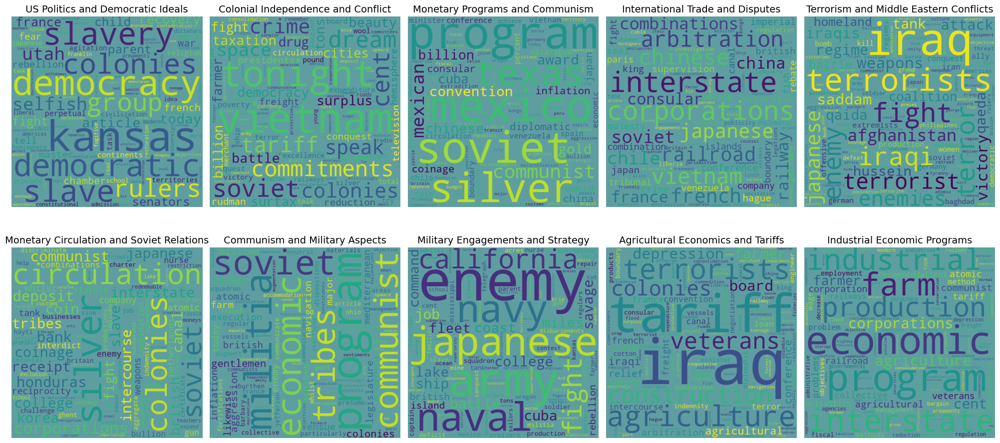

In [64]:
# Visualize the selected topics using word clouds
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.flatten()

for i, topic_idx in enumerate(selected_topics_LSI):
    fig.add_subplot(axes[i])
    topic_words = dict(lsi_model.show_topic(topic_idx, topn=200))
    cloud = WordCloud(width=500, height=500, background_color='cadetblue')
    cloud.generate_from_frequencies(topic_words)
    axes[i].imshow(cloud)
    # Get the topic label 
    topic_label = topic_labels_LSI.get(topic_idx, f"Topic {topic_idx}")
    axes[i].set_title(topic_label, fontdict=dict(size=14))
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### CALCULATING COHERENCE VALUES FOR LDA TO FIND OPTIMIZED NUMBER OF TOPICS FOR THE MODEL

In [24]:
# Declaring a fuction to compute coherence values using LDA model, to find optimized number of topics

def coherence_LDA(dictionary, corpus, texts, limit, start = 15, step = 1):

    # Initialize empty lists to store the models and coherence values
    coherence_values = []
    model_list = []

    # Iterate over different numbers of topics, starting from 'start' and ending at 'limit', with a step size of 'step'
    for num_topics in range(start, limit, step):

        # Train the LSI model with the current number of topics
        model =  gensim.models.LdaMulticore(corpus = corpus, num_topics = num_topics, id2word = dictionary)

        # Append the trained model to the list of models
        model_list.append(model)

        # Compute coherence value for the trained model using the 'c_v' coherence measure
        coherencemodel = CoherenceModel(model = model, texts = texts, dictionary = dictionary, coherence = 'c_v')
        coherence_values.append(coherencemodel.get_coherence())

    # Return the list of models with coherence values using the 'c_v' coherence measure
    return model_list, coherence_values

In [27]:
# Adjust to compute coherence values in 1 step intervals
model_list_LDA, coherence_values_LDA = coherence_LDA(dictionary = dictionary, corpus = bow_corpus, texts = preprocessed_document, start = 15, limit = 31, step = 1)

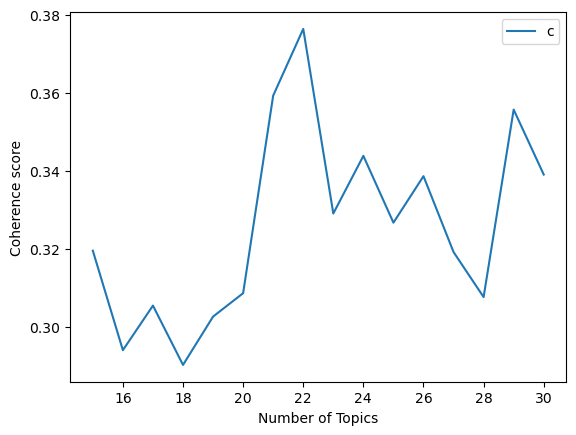

Number of Topics = 15  has Coherence Value of 0.3195
Number of Topics = 16  has Coherence Value of 0.294
Number of Topics = 17  has Coherence Value of 0.3054
Number of Topics = 18  has Coherence Value of 0.2902
Number of Topics = 19  has Coherence Value of 0.3026
Number of Topics = 20  has Coherence Value of 0.3086
Number of Topics = 21  has Coherence Value of 0.3592
Number of Topics = 22  has Coherence Value of 0.3763
Number of Topics = 23  has Coherence Value of 0.329
Number of Topics = 24  has Coherence Value of 0.3438
Number of Topics = 25  has Coherence Value of 0.3267
Number of Topics = 26  has Coherence Value of 0.3386
Number of Topics = 27  has Coherence Value of 0.3191
Number of Topics = 28  has Coherence Value of 0.3076
Number of Topics = 29  has Coherence Value of 0.3557
Number of Topics = 30  has Coherence Value of 0.339


In [28]:
# Show graph with 1 step intervals
limit = 31
start = 15
step = 1  

# Plot the coherence scores
x = range(start, limit, step)
plt.plot(x, coherence_values_LDA)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

# Print the coherence scores with 1 step intervals
for m, cv in zip(x, coherence_values_LDA):
    print("Number of Topics =", m, " has Coherence Value of", round(cv, 4))

In [29]:
optimum_num_topics_LDA = start + (coherence_values_LDA.index(max(coherence_values_LDA)))
print(f"Optimum Number of Topics = {optimum_num_topics_LDA}, with Coherence Value of {max(coherence_values_LDA):.4f}")

Optimum Number of Topics = 22, with Coherence Value of 0.3763


### BUILDING AN LDA MODEL ON THE OPTIMAL NUMBER OF TOPICS FOUND ABOVE

In [30]:
# Train the LDA model with the optimum number of topics found above 
lda_model = gensim.models.LdaMulticore(tfidf_corpus, id2word=dictionary, num_topics=optimum_num_topics_LDA)

In [31]:
# Print the topics
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.001*"colonies" + 0.001*"tonight" + 0.001*"job" + 0.001*"port" + 0.001*"cuba" + 0.001*"militia" + 0.001*"spanish" + 0.001*"soviet" + 0.001*"program" + 0.001*"budget"
Topic: 1 
Words: 0.002*"program" + 0.001*"economic" + 0.001*"billion" + 0.001*"cent" + 0.001*"farm" + 0.001*"court" + 0.001*"help" + 0.001*"budget" + 0.001*"examinations" + 0.001*"gold"
Topic: 2 
Words: 0.001*"silver" + 0.001*"tariff" + 0.001*"program" + 0.001*"gentlemen" + 0.001*"nicaragua" + 0.001*"acres" + 0.001*"minister" + 0.001*"britain" + 0.001*"wool" + 0.001*"intercourse"
Topic: 3 
Words: 0.002*"spain" + 0.001*"coinage" + 0.001*"catholic" + 0.001*"silver" + 0.001*"minister" + 0.001*"article" + 0.001*"coast" + 0.001*"children" + 0.001*"ratify" + 0.001*"program"
Topic: 4 
Words: 0.001*"enemy" + 0.001*"railways" + 0.001*"loan" + 0.001*"british" + 0.001*"reconstruction" + 0.001*"savage" + 0.001*"militia" + 0.001*"prisoners" + 0.001*"saddam" + 0.001*"decree"
Topic: 5 
Words: 0.001*"terrorists" + 0.001*

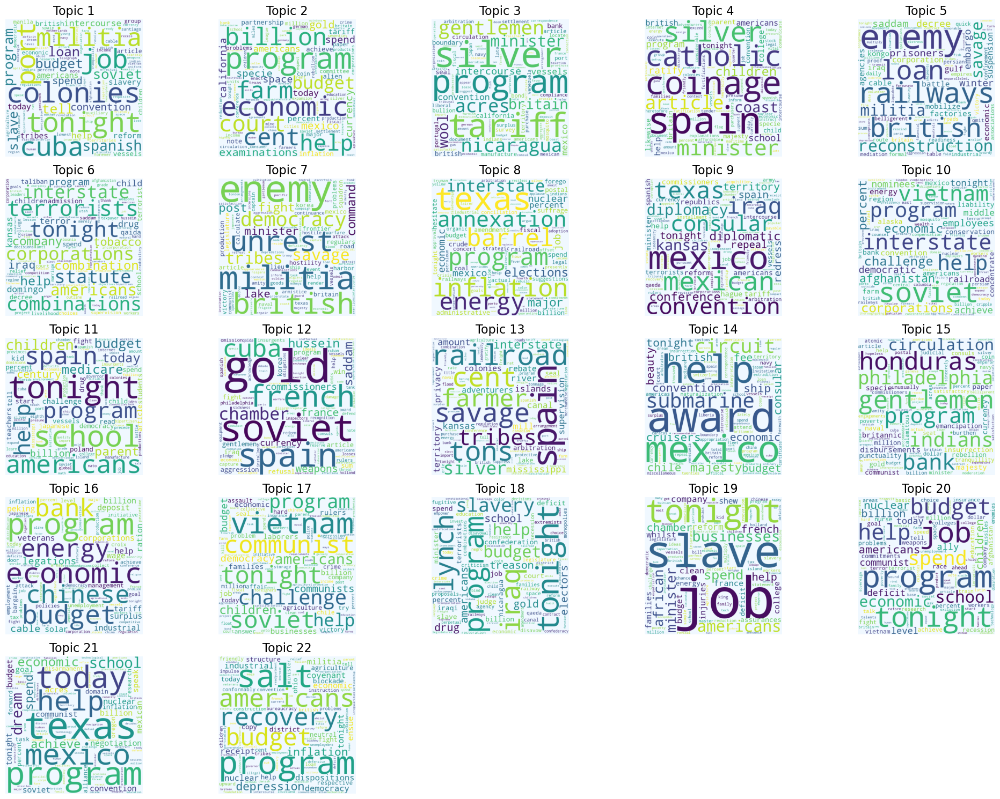

In [32]:
# Calculate the number of rows and columns for the subplots
num_cols = math.ceil(math.sqrt(optimum_num_topics_LDA))
num_rows = math.ceil(optimum_num_topics_LDA / num_cols)

# Create a figure and axes for the subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 15), squeeze=False)

# Loop over the number of topics to generate word clouds
for i in range(optimum_num_topics_LDA):
    # Assuming lda_model.show_topic(i, topn=100) gets the top 100 words & their probabilities for topic i
    topic_words = dict(lda_model.show_topic(i, topn=100))
    
    # Generate the word cloud
    cloud = WordCloud(width=500, height=500, background_color='aliceblue').generate_from_frequencies(topic_words)
    
    # Calculate the row and column index for the current subplot
    row = i // num_cols
    col = i % num_cols
    
    # Plot the word cloud on the corresponding subplot
    axes[row, col].imshow(cloud)
    axes[row, col].set_title(f'Topic {i+1}', fontdict={'size': 16})
    axes[row, col].axis('off')

# Remove any unused subplots
for i in range(optimum_num_topics_LDA, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

In [33]:
# Create a visualisation of the LDA model using pyLDAvis
vis = pyLDAvis.gensim.prepare(lda_model, tfidf_corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.007566 -0.020266       1        1  37.765559
8      0.010512 -0.013872       2        1  14.202299
2      0.016901 -0.011678       3        1  14.056909
15    -0.009492 -0.011081       4        1   8.031794
19    -0.017723  0.004100       5        1   4.206855
6      0.018838  0.012350       6        1   3.491716
0      0.002459  0.003696       7        1   2.430693
10    -0.006638  0.008510       8        1   2.134513
13     0.007456 -0.005873       9        1   1.878845
5     -0.012430  0.003588      10        1   1.746823
21     0.004037  0.005970      11        1   1.537216
3      0.005044  0.002991      12        1   1.304853
17    -0.007770 -0.001537      13        1   1.185909
12     0.009651 -0.002404      14        1   0.991791
18    -0.003064  0.004518      15        1   0.746747
4      0.006201  0.008861      16        1   0.699426
20    -0.006486  0.000723      17        1   0.688748
14     0.004347  0.003243      18        1   0.628984
9     -0.003304 -0.003651      19        1   0.624532
16    -0.009745  0.002556      20        1   0.565973
11    -0.000459  0.006572      21        1   0.547619
7     -0.000768  0.002685      22        1   0.532194, topic_info=           Term      Freq     Total Category  logprob  loglift
5163    program  5.000000  5.000000  Default  30.0000  30.0000
4979   economic  4.000000  4.000000  Default  29.0000  29.0000
4566       help  3.000000  3.000000  Default  28.0000  28.0000
5644    tonight  2.000000  2.000000  Default  27.0000  27.0000
2112  americans  3.000000  3.000000  Default  26.0000  26.0000
...         ...       ...       ...      ...      ...      ...
4791  strategic  0.012717  0.897993  Topic22  -7.5204   0.9787
1130     fiscal  0.013748  2.170383  Topic22  -7.4424   0.1742
5256     budget  0.013979  3.477642  Topic22  -7.4258  -0.2807
5644    tonight  0.013453  2.680193  Topic22  -7.4642  -0.0586
3872   railroad  0.013102  1.617892  Topic22  -7.4906   0.4198

[1300 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
2591      1  0.455808      achieve
2108      1  0.768609  acquisition
4126      3  0.736487        acres
4718      1  0.821500     advisory
662       1  0.612984   aggression
...     ...       ...          ...
5652      1  0.832245      vietnam
1796      1  0.763159     vigorous
2229      1  0.644874         wage
3790      1  0.638955      weapons
4682      3  1.015657         wool

[185 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 9, 3, 16, 20, 7, 1, 11, 14, 6, 22, 4, 18, 13, 19, 5, 21, 15, 10, 17, 12, 8])

### DEFINING TOPIC NAMES FOR THE VARIOUS TOPICS GENERATED BY THE LDA MODEL

In [34]:
topic_names_LDA = {
    0: "Travel Program and International Economics",
    1: "Economic Aid and Budget",
    2: "Trade Policies",
    3: "Religion and Monetary Policy",
    4: "Railroads and Military Infrastructure",
    5: "Child Welfare and Terrorism",
    6: "Postal Services and Civil Unrest",
    7: "Texan Politics and Nuclear Power",
    8: "Mexican Convention and Diplomacy",
    9: "Energy Programs and International Relations",
    10: "Education and Economic Aid",
    11: "Gold Standard and International Monetary Policy",
    12: "Transportation and Interstate Agricultural Development",
    13: "Colonialism and Sovereignty",
    14: "Monetary Circulation and International Trade",
    15: "Banking and Economic Recovery",
    16: "Vietnam Conflict and Communism",
    17: "Education and Slavery",
    18: "Business, Slavery and Job Creation",
    19: "Nuclear Energy and Budgeting",
    20: "Modern Education and Economic Programs",
    21: "Industrial Recovery and Budget Allocation"   
}


### SAMPLING 10 RANDOM TOPICS FOR FURTHER ANALYSIS WHICH WERE GENERATED BY THE LDA MODEL

In [35]:
# Sampling 10 random topics from the 22 topics generated above

# Randomly sample ten topics for closer analysis
selected_topics_LDA = np.random.choice(range(num_topics), size=10, replace=False)


print("\nSampled Topics for Closer Analysis:\n")
sampled_topics = [(topic_num, lda_model.print_topic(topic_num)) for topic_num in selected_topics_LDA]
for topic_num, topic in sampled_topics:
    print(f"Topic {topic_num}: {topic}")


Sampled Topics for Closer Analysis:

Topic 11: 0.001*"gold" + 0.001*"soviet" + 0.001*"spain" + 0.001*"french" + 0.001*"cuba" + 0.001*"chamber" + 0.001*"hussein" + 0.001*"saddam" + 0.001*"france" + 0.001*"weapons"
Topic 13: 0.001*"award" + 0.001*"help" + 0.001*"mexico" + 0.001*"submarine" + 0.001*"circuit" + 0.001*"majesty" + 0.001*"convention" + 0.001*"tonight" + 0.001*"cruisers" + 0.001*"consular"
Topic 4: 0.001*"enemy" + 0.001*"railways" + 0.001*"loan" + 0.001*"british" + 0.001*"reconstruction" + 0.001*"savage" + 0.001*"militia" + 0.001*"prisoners" + 0.001*"saddam" + 0.001*"decree"
Topic 8: 0.002*"mexico" + 0.001*"mexican" + 0.001*"texas" + 0.001*"iraq" + 0.001*"convention" + 0.001*"consular" + 0.001*"diplomacy" + 0.001*"kansas" + 0.001*"diplomatic" + 0.001*"conference"
Topic 0: 0.001*"colonies" + 0.001*"tonight" + 0.001*"job" + 0.001*"port" + 0.001*"cuba" + 0.001*"militia" + 0.001*"spanish" + 0.001*"soviet" + 0.001*"program" + 0.001*"budget"
Topic 2: 0.001*"silver" + 0.001*"tariff"

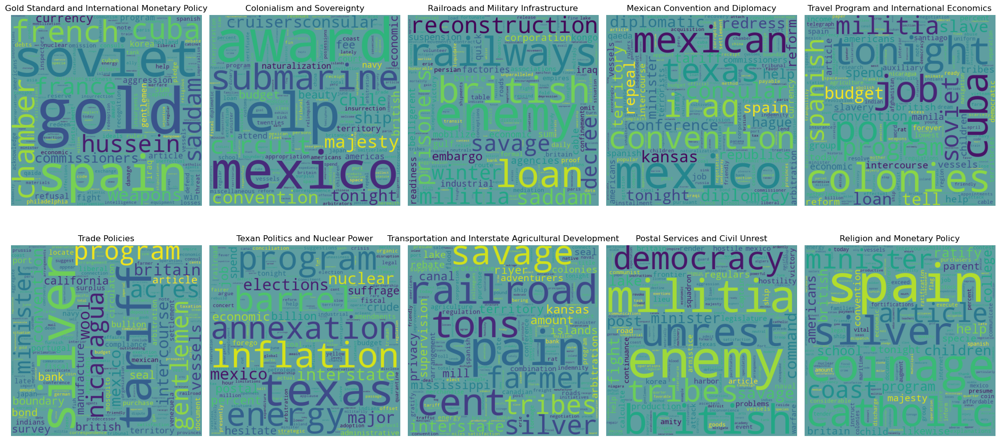

In [37]:
# Visualize the selected topics using word clouds
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.flatten()

for i, topic_idx in enumerate(selected_topics_LDA):
    fig.add_subplot(axes[i])
    topic_words = dict(lda_model.show_topic(topic_idx, topn=200))
    cloud = WordCloud(width=500, height=500, background_color='cadetblue')
    cloud.generate_from_frequencies(topic_words)
    axes[i].imshow(cloud)
    # Get the topic label 
    topic_label = topic_names_LDA.get(topic_idx, f"Topic {topic_idx}")
    axes[i].set_title(topic_label, fontdict=dict(size=12))
    axes[i].axis('off')

plt.tight_layout()
plt.show()

### SPLITTING DATA INTO DECADES OF 20th and 21st CENTURY AND CREATING SEPERATE LDA MODELS FOR EACH DECADE TO CHECK THE CHANGE IN SPEECHES OVER TIME
#### FIRSTLY COHERENCE VALUE WILL BE CALCULATED TO FIND OPTIMAL NUMBER OF TOPICS FOR EACH DECADE, THEN THE LDA MODEL WILL BE TRAINED ON THIS VALUE FOR EACH DECADE AND FINALLY A PLOT WILL BE GIVEN TO SHOW THE OUTPUTS OF THE MODEL

In [51]:
# Create a new column to store preporcessed text for each year
state_of_union['preprocessed_text'] = state_of_union['text'].apply(preprocess)

# Filter the years required- 1900 to 2012
data = state_of_union[(state_of_union['year'] >= 1900) & (state_of_union['year'] <= 2012)]

# Group speeches by decade
pd.options.mode.chained_assignment = None  # remove default warning
data.loc[:, 'decade'] = data['year'] // 10 * 10
decade_groups = data.groupby('decade')

In [65]:
# Initialize dictionary to store topics over time
topics_over_time = {}

# Train LDA models for each decade
for decade, group in decade_groups:
    # Create dictionary and corpus
    dictionary = corpora.Dictionary(group['preprocessed_text'])
    corpus = [dictionary.doc2bow(text) for text in group['preprocessed_text']]
    
    # Determine the optimal number of topics using coherence scores
    coherence_scores = []
    for num_topics in range(10, 30, 2):
        lda_model = gensim.models.LdaMulticore(corpus, num_topics=num_topics, id2word=dictionary)
        coherence_model = CoherenceModel(model=lda_model, texts=group['preprocessed_text'], 
                                         dictionary=dictionary, coherence='c_v')
        coherence_scores.append(coherence_model.get_coherence())
    
    optimal_topics = coherence_scores.index(max(coherence_scores)) + 10
    
    # Train the LDA model with the optimal number of topics
    lda_model = gensim.models.LdaMulticore(corpus, num_topics=optimal_topics, id2word=dictionary)
    print(f"Model for decade- {decade} trained with optimal topics = {optimal_topics}")
    # Store the topics for the decade
    topics_over_time[decade] = lda_model.print_topics(num_words=10)


Model for decade- 1900 trained with optimal topics = 16
Model for decade- 1910 trained with optimal topics = 18
Model for decade- 1920 trained with optimal topics = 10
Model for decade- 1930 trained with optimal topics = 11
Model for decade- 1940 trained with optimal topics = 16
Model for decade- 1950 trained with optimal topics = 15
Model for decade- 1960 trained with optimal topics = 19
Model for decade- 1970 trained with optimal topics = 12
Model for decade- 1980 trained with optimal topics = 13
Model for decade- 1990 trained with optimal topics = 12
Model for decade- 2000 trained with optimal topics = 16
Model for decade- 2010 trained with optimal topics = 11


In [66]:
# Print the topics for each decade
for decade, topics in topics_over_time.items():
    print(f"\nDecade: {decade}")
    for topic in topics:
        print(topic)


Decade: 1900
(0, '0.010*"state" + 0.010*"government" + 0.006*"great" + 0.005*"work" + 0.004*"power" + 0.004*"american" + 0.004*"country" + 0.004*"unite" + 0.004*"condition" + 0.004*"congress"')
(1, '0.010*"government" + 0.008*"state" + 0.006*"power" + 0.006*"great" + 0.005*"business" + 0.005*"public" + 0.004*"national" + 0.004*"labor" + 0.004*"corporations" + 0.004*"commerce"')
(2, '0.011*"government" + 0.010*"state" + 0.007*"power" + 0.006*"great" + 0.006*"unite" + 0.005*"public" + 0.005*"corporations" + 0.005*"labor" + 0.005*"business" + 0.004*"congress"')
(3, '0.009*"government" + 0.008*"state" + 0.005*"business" + 0.005*"american" + 0.005*"unite" + 0.005*"power" + 0.005*"great" + 0.004*"congress" + 0.004*"people" + 0.004*"public"')
(4, '0.007*"government" + 0.007*"power" + 0.007*"state" + 0.007*"business" + 0.006*"congress" + 0.005*"condition" + 0.005*"people" + 0.005*"public" + 0.005*"great" + 0.005*"labor"')
(5, '0.007*"state" + 0.007*"business" + 0.007*"public" + 0.006*"power" 

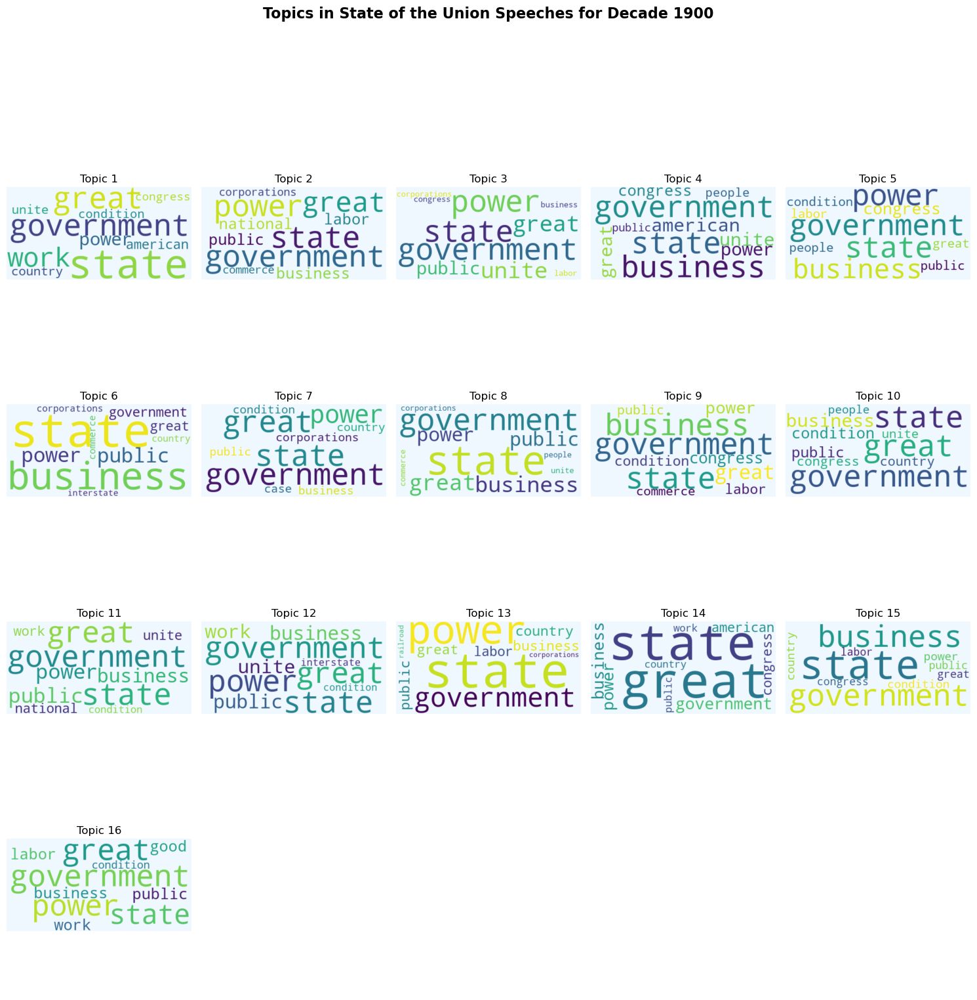

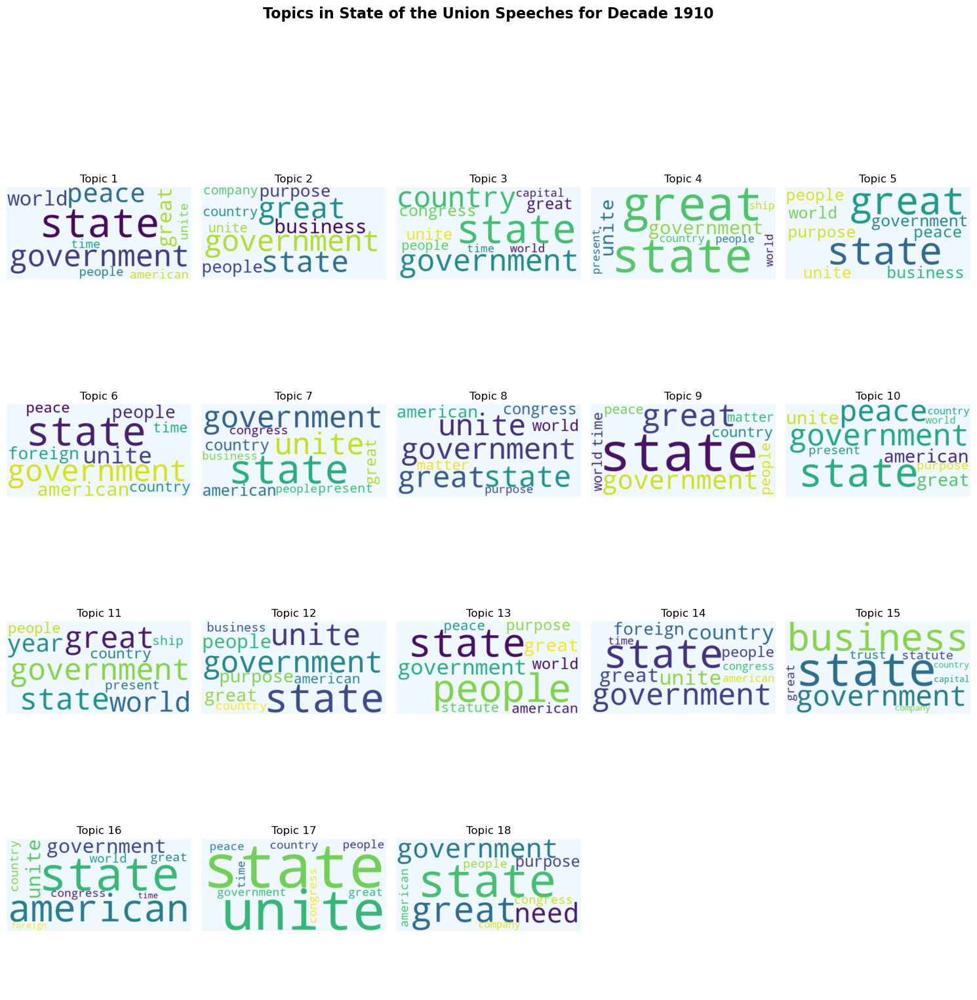

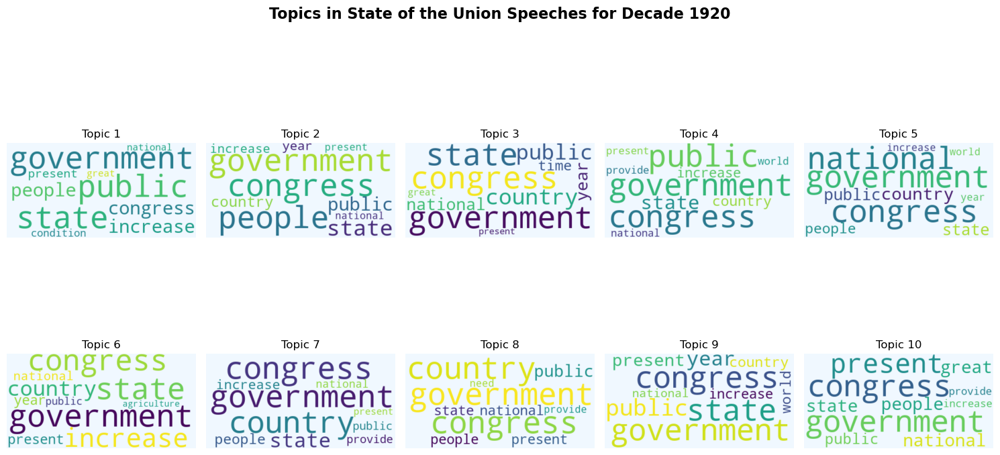

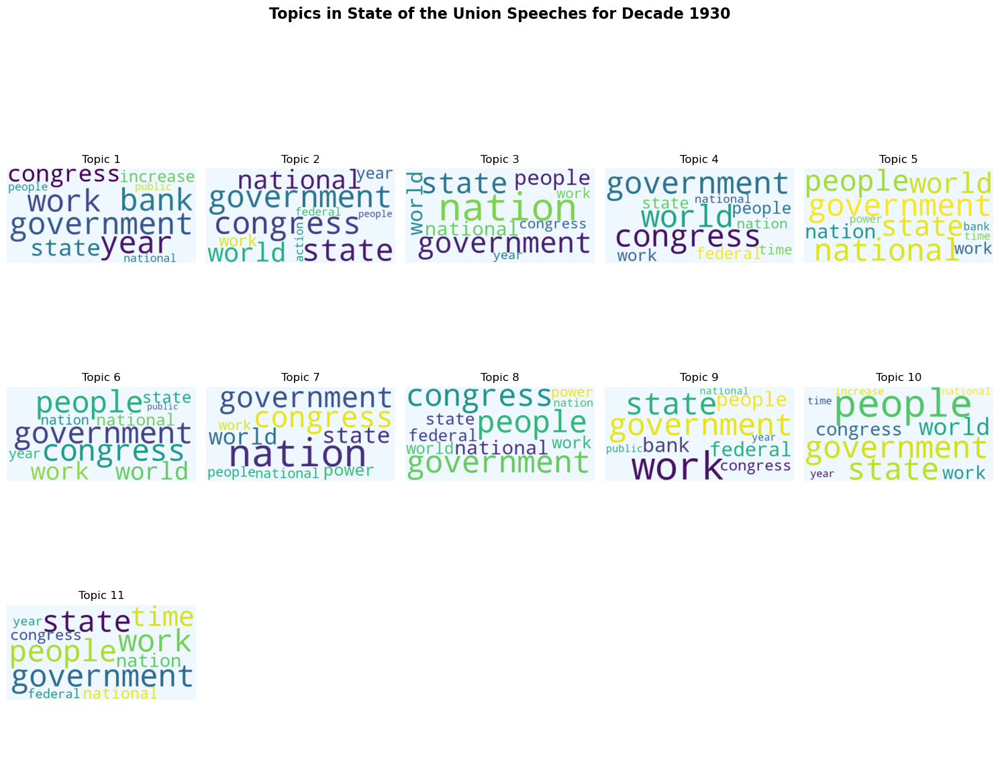

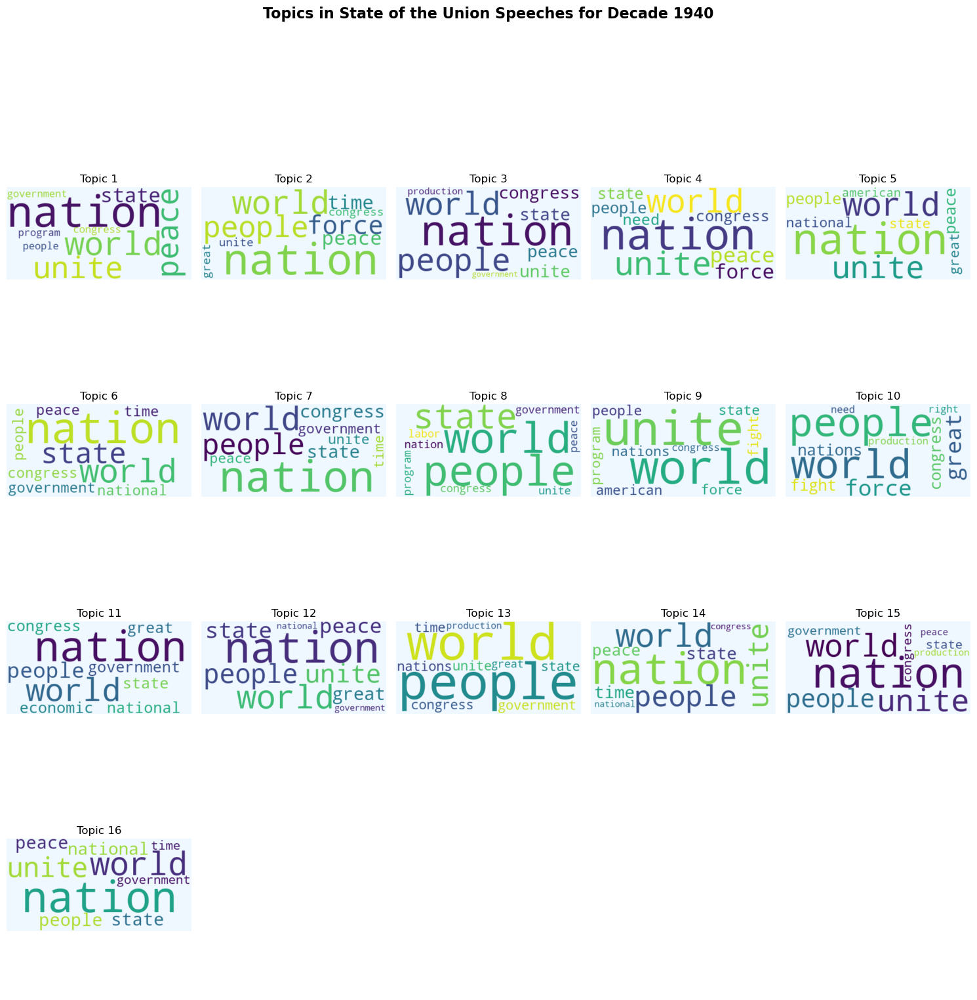

...

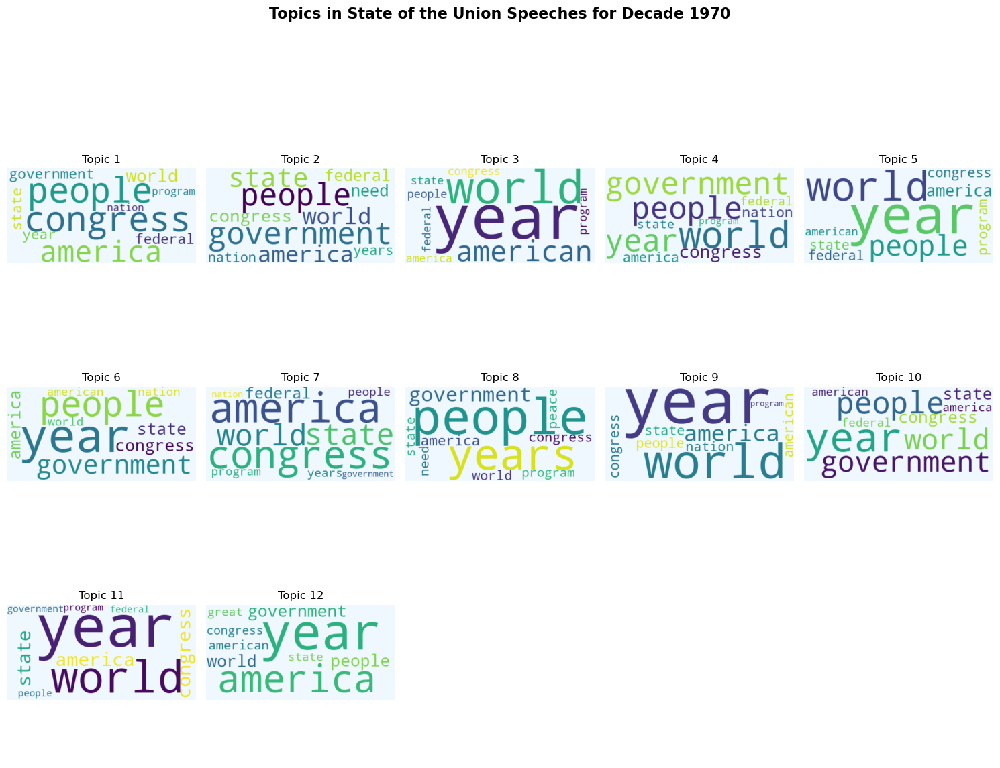

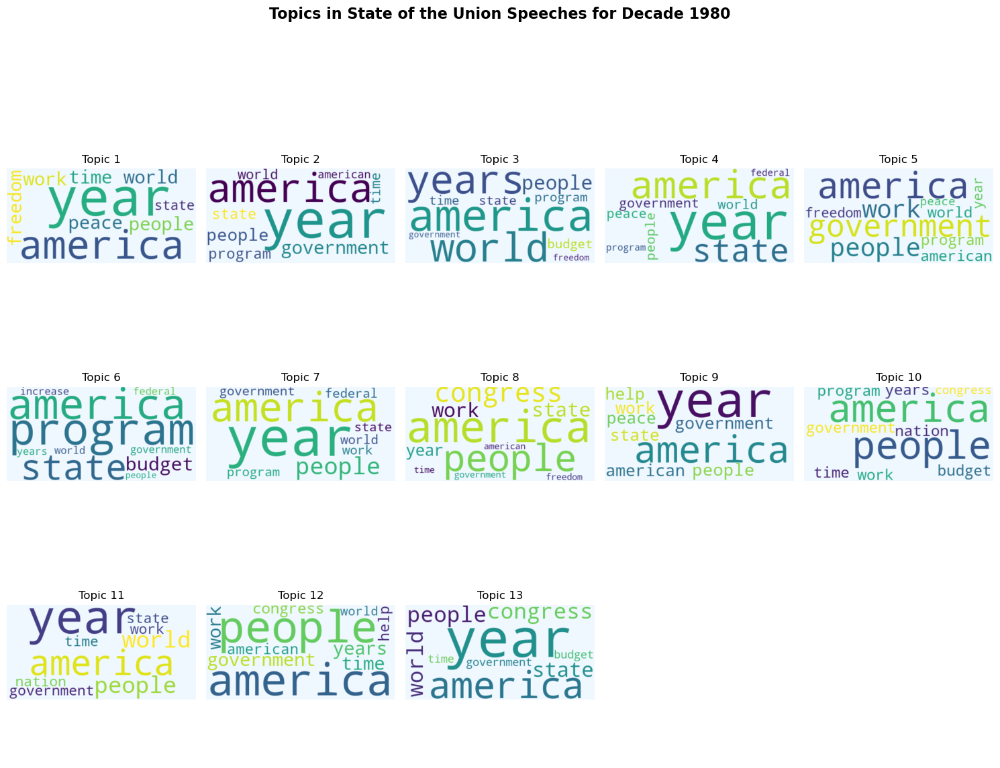

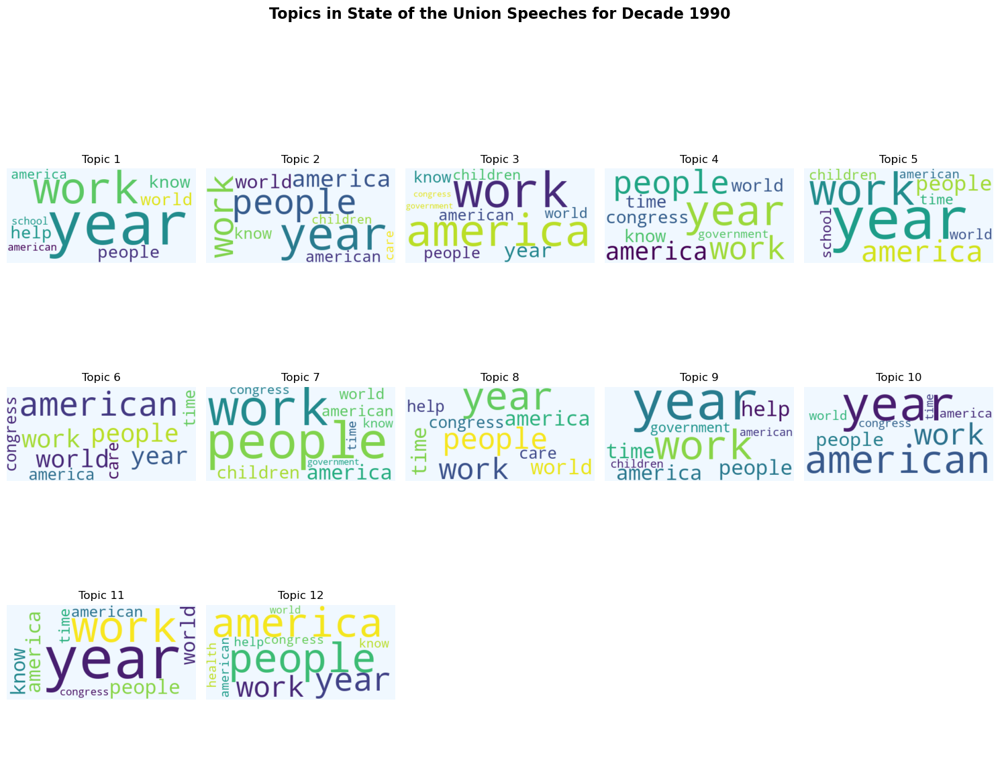

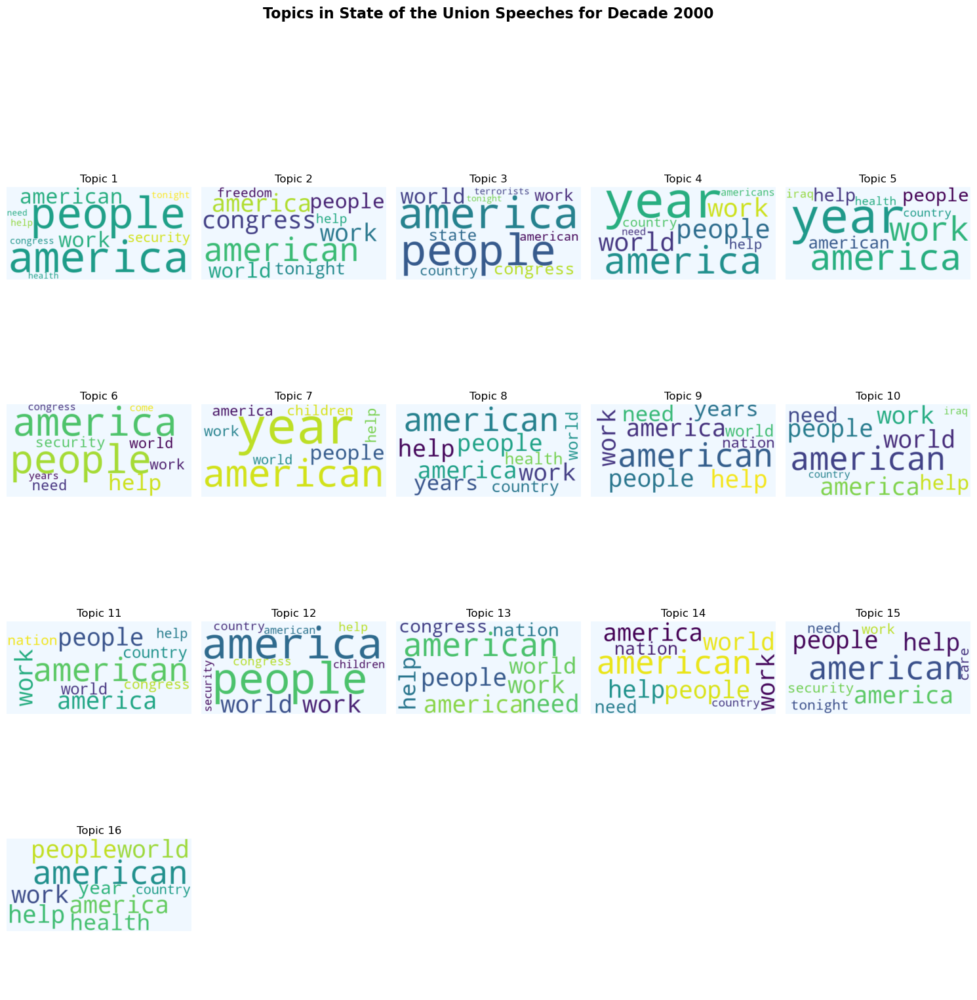

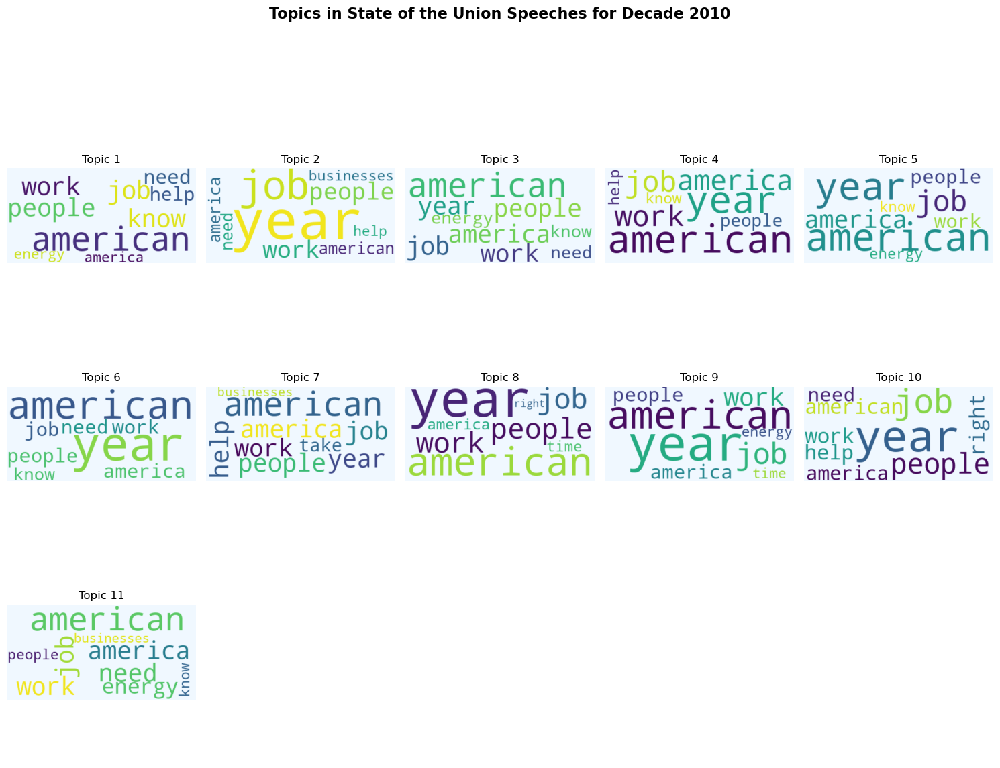

In [67]:
for decade, topics in topics_over_time.items():
    # Calculate the number of rows and columns based on the number of topics
    num_topics = len(topics)
    num_cols = min(5, num_topics)
    num_rows = (num_topics + num_cols - 1) // num_cols

    # Create a figure for the decade
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
    fig.suptitle(f"Topics in State of the Union Speeches for Decade {decade}", fontsize=16, fontweight='bold')

    # Flatten the axes array for easy iteration
    axs = axs.flatten()

    # Iterate over the topics for the current decade
    for i, topic in enumerate(topics):
        # Extract the words from the topic string
        words = [word.split("*")[1].strip() for word in topic[1].split(" + ")]
        # Join the words into a single string
        topic_words = " ".join(words)

        # Create a word cloud for the topic
        wordcloud = WordCloud(width=400, height=200, background_color='aliceblue').generate(topic_words)

        # Plot the word cloud in the corresponding subplot
        axs[i].imshow(wordcloud, interpolation='bilinear')
        axs[i].set_title(f"Topic {i+1}", fontsize=12)
        axs[i].axis('off')

    # Hide any unused subplots
    for j in range(i+1, num_rows*num_cols):
        axs[j].axis('off')

    # Adjust spacing and display the plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.subplots_adjust(hspace=0.0)  
    plt.show()